Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt


Reading the Data

In [2]:
data =  pd.read_csv('machine_failure.csv')

Checking the Data

In [3]:
data.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure
0,1,M14860,M,298.1,308.6,1551,42.8,0,0
1,2,L47181,L,298.2,308.7,1408,46.3,3,0
2,3,L47182,L,298.1,308.5,1498,49.4,5,0
3,4,L47183,L,298.2,308.6,1433,39.5,7,0
4,5,L47184,L,298.2,308.7,1408,40.0,9,0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   10000 non-null  int64  
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  int64  
 8   Machine failure          10000 non-null  int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 703.2+ KB


# Encoding the Type Categorical variable

In [5]:
dummies = pd.get_dummies(data['Type'], prefix =  'Type')
dummies.head()

,Type_H,Type_L,Type_M
0,0,0,1
1,0,1,0
2,0,1,0
3,0,1,0
4,0,1,0


In [6]:
data = pd.concat([data, dummies], axis=1)
data.drop('Type', inplace =  True, axis = 1)

### All product ids are unique so dropping the duplicate identifier column

In [7]:
data.drop('Product ID', inplace = True, axis = 1)

### Plotting the distribution for each variables against target variables

In [8]:
import plotly.express as px
df = data
fig = px.scatter_matrix(df,
    color="Machine failure", symbol="Machine failure",
    title="Scatter matrix data set",
    labels={col:col.replace('_', ' ') for col in df.columns}, width=2000, height=1000) # remove underscore
fig.update_traces(diagonal_visible=False)
fig.show()

In [9]:
import plotly.express as px
df = data
fig = px.histogram(df, x="Air temperature [K]", color="Machine failure", marginal="box",
                   hover_data=df.columns)
fig.show()

In [10]:
import plotly.express as px
df = data
fig = px.histogram(df, x="Process temperature [K]", color="Machine failure", marginal="box",
                   hover_data=df.columns)
fig.show()

In [21]:
import plotly.express as px
df = data
fig = px.histogram(df, x="Rotational speed [rpm]", color="Machine failure", marginal="box",
                   hover_data=df.columns)
fig.show()

In [22]:
import plotly.express as px
df = data
fig = px.histogram(df, x="Torque [Nm]", color="Machine failure", marginal="box",
                   hover_data=df.columns)
fig.show()

In [23]:
import plotly.express as px
df = data
fig = px.histogram(df, x="Tool wear [min]", color="Machine failure", marginal="box",
                   hover_data=df.columns)
fig.show()

#### Looking at the plot variables Air Temperature[K], Process temperature [K], Torque [Nm] has a normal distribution, Rotational speed [rpm]  is skewed towards the right while Tool wear [min]  seems to have a uniform distribution mostly with a minor skew towards the right. We can now check the summary for each variables and also plot the box plots with machine failure to see how the distribution is.

In [26]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Air temperature [K]      10000 non-null  float64
 2   Process temperature [K]  10000 non-null  float64
 3   Rotational speed [rpm]   10000 non-null  int64  
 4   Torque [Nm]              10000 non-null  float64
 5   Tool wear [min]          10000 non-null  int64  
 6   Machine failure          10000 non-null  int64  
 7   Type_H                   10000 non-null  uint8  
 8   Type_L                   10000 non-null  uint8  
 9   Type_M                   10000 non-null  uint8  
dtypes: float64(3), int64(4), uint8(3)
memory usage: 576.3 KB


In [27]:
data.Type_H = data.Type_H.astype(int)
data.Type_L = data.Type_L.astype(int)
data.Type_M = data.Type_M.astype(int)

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Air temperature [K]      10000 non-null  float64
 2   Process temperature [K]  10000 non-null  float64
 3   Rotational speed [rpm]   10000 non-null  int64  
 4   Torque [Nm]              10000 non-null  float64
 5   Tool wear [min]          10000 non-null  int64  
 6   Machine failure          10000 non-null  int64  
 7   Type_H                   10000 non-null  int32  
 8   Type_L                   10000 non-null  int32  
 9   Type_M                   10000 non-null  int32  
dtypes: float64(3), int32(3), int64(4)
memory usage: 664.2 KB


In [29]:
data.describe()

,UDI,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Machine failure,Type_H,Type_L,Type_M
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,300.004930,310.005560,1538.776100,39.986910,107.951000,0.033900,0.100300,0.600000,0.299700
std,2886.89568,2.000259,1.483734,179.284096,9.968934,63.654147,0.180981,0.300415,0.489922,0.458149
min,1.00000,295.300000,305.700000,1168.000000,3.800000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2500.75000,298.300000,308.800000,1423.000000,33.200000,53.000000,0.000000,0.000000,0.000000,0.000000
50%,5000.50000,300.100000,310.100000,1503.000000,40.100000,108.000000,0.000000,0.000000,1.000000,0.000000
75%,7500.25000,301.500000,311.100000,1612.000000,46.800000,162.000000,0.000000,0.000000,1.000000,1.000000
max,10000.00000,304.500000,313.800000,2886.000000,76.600000,253.000000,1.000000,1.000000,1.000000,1.000000


Lets check the box plots for the same

<AxesSubplot:xlabel='Machine failure', ylabel='Air temperature [K]'>

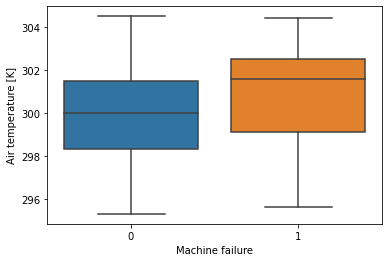

In [32]:
sns.boxplot(x="Machine failure", y="Air temperature [K]",data=data)

<AxesSubplot:xlabel='Machine failure', ylabel='Process temperature [K]'>

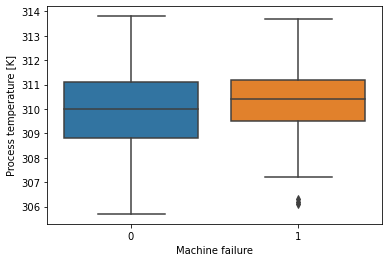

In [33]:
sns.boxplot(x="Machine failure", y="Process temperature [K]",data=data)

<AxesSubplot:xlabel='Machine failure', ylabel='Rotational speed [rpm]'>

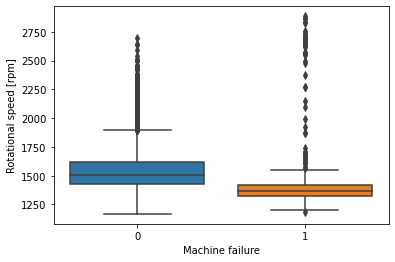

In [34]:
sns.boxplot(x="Machine failure", y="Rotational speed [rpm]",data=data)

<AxesSubplot:xlabel='Machine failure', ylabel='Torque [Nm]'>

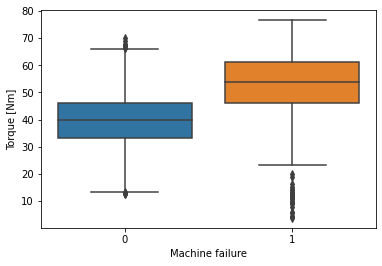

In [35]:
sns.boxplot(x="Machine failure", y="Torque [Nm]",data=data)

<AxesSubplot:xlabel='Machine failure', ylabel='Tool wear [min]'>

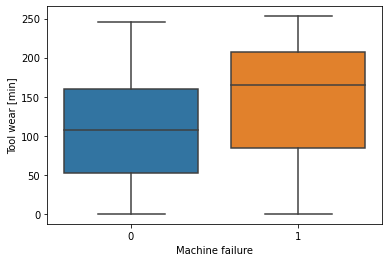

In [36]:
sns.boxplot(x="Machine failure", y="Tool wear [min]",data=data)


Lets check the distribution of categorical variables

In [39]:
data[['Machine failure']].value_counts()

Machine failure
0                  9661
1                   339
dtype: int64

In [23]:
percentage = data[data['Machine failure'] == 1].shape[0] / data.shape[0]
print(percentage)

0.0339


In [42]:
data[['Machine failure', 'Type_H' ]].value_counts()

Machine failure  Type_H
0                0         8679
                 1          982
1                0          318
                 1           21
dtype: int64

In [43]:
data[['Machine failure', 'Type_M' ]].value_counts()

Machine failure  Type_M
0                0         6747
                 1         2914
1                0          256
                 1           83
dtype: int64

In [44]:
data[['Machine failure', 'Type_L' ]].value_counts()

Machine failure  Type_L
0                1         5765
                 0         3896
1                1          235
                 0          104
dtype: int64

Approximately 3% of the data results in machine failure. From looking at the data and quantitle distribution  we see that higher air temperature, Tool wear, Torque increases probability of machine failure while lower rotational speed also increases the probability of machine failure Process temperature and Type does not seem to contribute much.